In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [2]:
df=pd.read_csv("water_potability.csv")
df.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


In [3]:
df.columns

Index(['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity',
       'Organic_carbon', 'Trihalomethanes', 'Turbidity', 'Potability'],
      dtype='object')

In [4]:
df.isnull().sum()

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [6]:
df.duplicated().sum()

0

In [7]:
df.duplicated().sum()

0

In [8]:
df.shape

(3276, 10)

In [9]:
df.dtypes

ph                 float64
Hardness           float64
Solids             float64
Chloramines        float64
Sulfate            float64
Conductivity       float64
Organic_carbon     float64
Trihalomethanes    float64
Turbidity          float64
Potability           int64
dtype: object

**Inference**-

* Our data doesn't have any categorical column
* Datadoesn't have duplicate values 
* Data has a shape of 3276 rows and 10 columns
* Data has null values in ph,sulfate,Trihalomethanes columns

### Univariate Analysis

In [10]:
y=df["Potability"].value_counts()
y

0    1998
1    1278
Name: Potability, dtype: int64

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


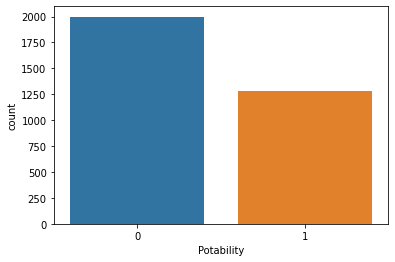

In [11]:
sns.countplot(df["Potability"])
plt.show()

In [12]:
fig=px.pie(values=df["Potability"].value_counts().values,names=df["Potability"].value_counts().index,hole=0.6,
           title="Potability distribution by value count",width=400,height=400)
fig.show()

In [13]:
df.columns

Index(['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity',
       'Organic_carbon', 'Trihalomethanes', 'Turbidity', 'Potability'],
      dtype='object')

In [14]:
for i in df.columns:
    fig=px.box(df[i],width=400,height=400,title=i,template="plotly")
    fig.show()

**Inference**
* Data set contains nearly 39% records which claims the water to be fit for drinking 
* from the box plot we can conclude that each of the column has outlier except for our target variable

In [15]:
df.describe([0.01,0.02,0.03,0.04,0.05,0.25,0.50,0.75,0.95,0.96,0.97,0.98,0.99,1])

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,2785.000000,3276.000000,3276.000000,3276.000000,2495.000000,3276.000000,3276.000000,3114.000000,3276.000000,3276.000000
mean,7.080795,196.369496,22014.092526,7.122277,333.775777,426.205111,14.284970,66.396293,3.966786,0.390110
std,1.594320,32.879761,8768.570828,1.583085,41.416840,80.824064,3.308162,16.175008,0.780382,0.487849
min,0.000000,47.432000,320.942611,0.352000,129.000000,181.483754,2.200000,0.738000,1.450000,0.000000
1%,3.406797,114.236366,5416.238724,3.203082,232.499338,269.422947,6.452487,27.759075,2.161414,0.000000
2%,3.789219,124.665401,7293.179525,3.714329,247.151547,279.655862,7.660652,32.251197,2.365800,0.000000
3%,4.035740,131.654356,8152.394221,4.076839,255.898973,288.511030,8.029141,34.910245,2.497215,0.000000
4%,4.292148,137.007355,8864.686480,4.313265,261.178442,294.383914,8.512225,37.358432,2.600619,0.000000
5%,4.487971,141.763281,9545.812579,4.503054,266.616232,300.109466,8.815362,39.552928,2.684279,0.000000
25%,6.093092,176.850538,15666.690297,6.127421,307.699498,365.734414,12.065801,55.844536,3.439711,0.000000


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



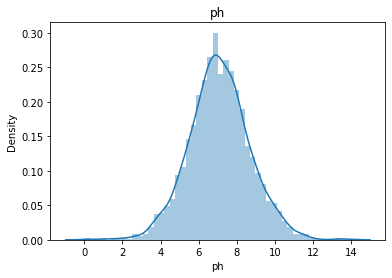

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



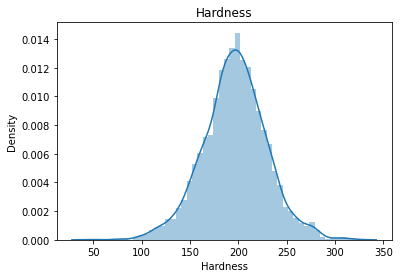

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



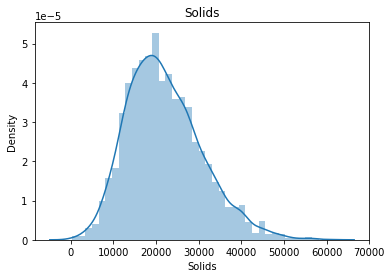

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



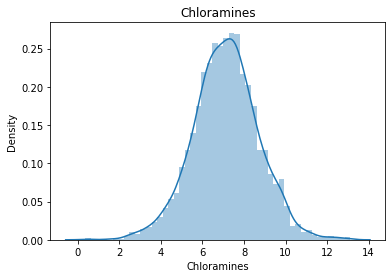

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



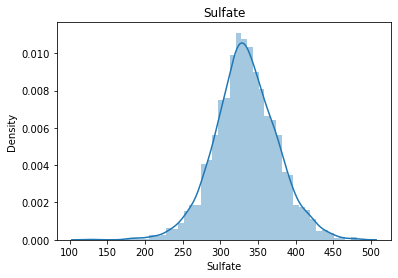

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



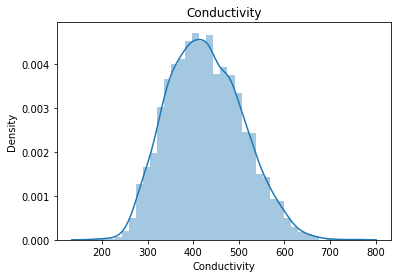

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



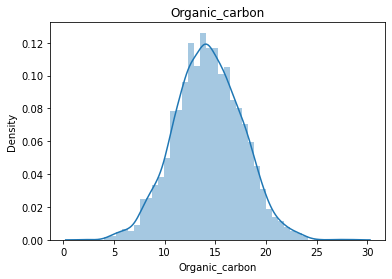

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



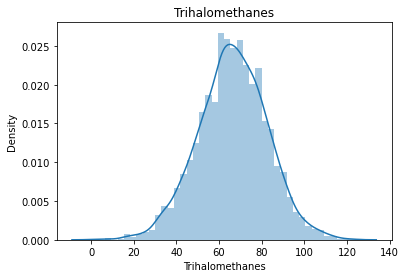

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



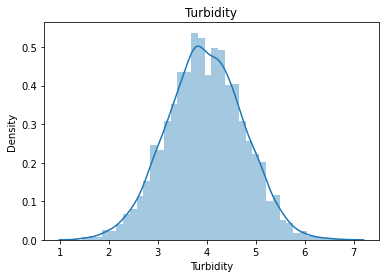

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



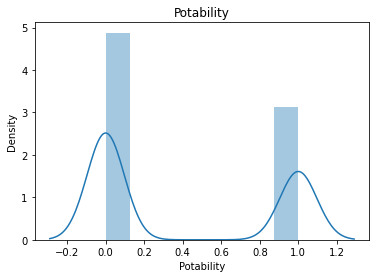

In [16]:
for i in df.columns:
    sns.distplot(df[i])
    plt.title(i)
    plt.show()

In [17]:
skew_val = df.skew().sort_values(ascending=False)
skew_val

Solids             0.621634
Potability         0.450784
Conductivity       0.264490
ph                 0.025630
Organic_carbon     0.025533
Turbidity         -0.007817
Chloramines       -0.012098
Sulfate           -0.035947
Hardness          -0.039342
Trihalomethanes   -0.083031
dtype: float64

**Inference**

* using pandas skew function to check the correlation between the values 
* Values between 0.5 to -0.5 will be considered as the normal distribution else will be skewed depending upon the skewness       value.

### Bivariate Analysis

In [18]:
fig = px.scatter (df, x = "ph", y = "Sulfate", color = "Potability",template="ggplot2",width=500,height=400,
                 title="sulfate v/s pH wrt Potabibility")
fig.show()

In [19]:
fig = px.scatter (df, x = "ph", y = "Hardness", color = "Potability",template="ggplot2",width=500,height=400,
                 title="Hardness v/s pH wrt Potabibility")
fig.show()

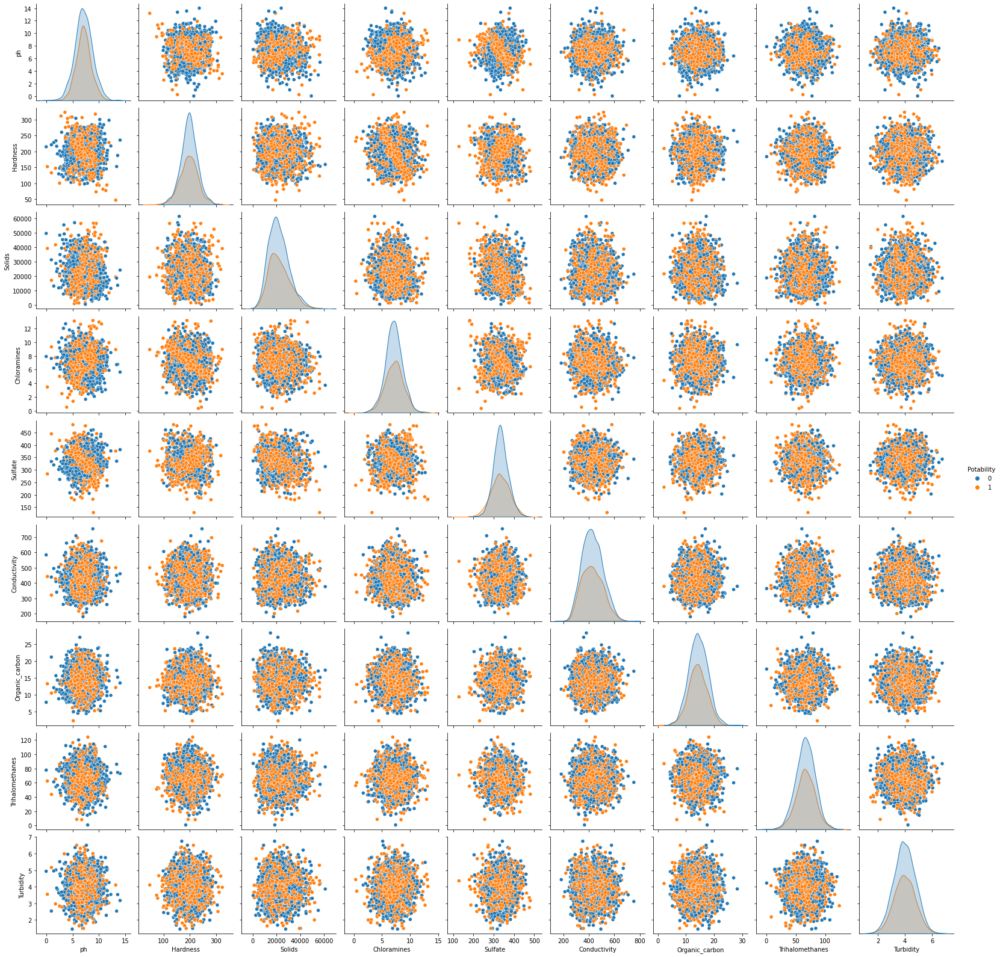

In [20]:
sns.pairplot(df,hue="Potability")
plt.show()

In [21]:
fig=px.box(df,x="Potability",y="Hardness",color = "Potability",template="ggplot2",width=500,height=400,
                 title="Outliers in Hardness wrt Potability")
fig.show()



In [22]:
fig=px.box(df,x="Potability",y="Sulfate",color = "Potability",template="ggplot2",width=500,height=400,
                 title="Outliers in Sulfate wrt Potability")
fig.show()

In [23]:
fig=px.box(df,x="Potability",y="Conductivity",color = "Potability",template="ggplot2",width=500,height=400,
                 title="Outliers in Conductivity wrt Potability")
fig.show()

In [24]:
fig=px.box(df,x="Potability",y="Organic_carbon",color = "Potability",template="ggplot2",width=500,height=400,
                 title="Outliers in Organic_carbon wrt Potability")
fig.show()

In [25]:
fig=px.box(df,x="Potability",y="Turbidity",color = "Potability",template="ggplot2",width=500,height=400,
                 title="Outliers in Turbidity wrt Potability")
fig.show()

**Inference**
* From the graphs above we can conclude that there are outliers in all the dependent features wrt independent feature
* from the pair plot it is sure that there is no linear relation amongst the features

### Outlier Treatment

In [26]:
df.describe([0.01,0.02,0.03,0.04,0.05,0.25,0.50,0.75,0.95,0.96,0.97,0.98,0.99,1])

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,2785.000000,3276.000000,3276.000000,3276.000000,2495.000000,3276.000000,3276.000000,3114.000000,3276.000000,3276.000000
mean,7.080795,196.369496,22014.092526,7.122277,333.775777,426.205111,14.284970,66.396293,3.966786,0.390110
std,1.594320,32.879761,8768.570828,1.583085,41.416840,80.824064,3.308162,16.175008,0.780382,0.487849
min,0.000000,47.432000,320.942611,0.352000,129.000000,181.483754,2.200000,0.738000,1.450000,0.000000
1%,3.406797,114.236366,5416.238724,3.203082,232.499338,269.422947,6.452487,27.759075,2.161414,0.000000
2%,3.789219,124.665401,7293.179525,3.714329,247.151547,279.655862,7.660652,32.251197,2.365800,0.000000
3%,4.035740,131.654356,8152.394221,4.076839,255.898973,288.511030,8.029141,34.910245,2.497215,0.000000
4%,4.292148,137.007355,8864.686480,4.313265,261.178442,294.383914,8.512225,37.358432,2.600619,0.000000
5%,4.487971,141.763281,9545.812579,4.503054,266.616232,300.109466,8.815362,39.552928,2.684279,0.000000
25%,6.093092,176.850538,15666.690297,6.127421,307.699498,365.734414,12.065801,55.844536,3.439711,0.000000


In [27]:
def outlier_treat(x):
    x=x.clip(upper=x.quantile(0.99))
    x=x.clip(lower=x.quantile(0.01))
    return(x)

In [28]:
df=df.apply(outlier_treat)

### Null Value Treatment

In [29]:
df.isnull().sum()

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64

In [30]:
df["ph"].fillna(df["ph"].mean(),inplace=True)
df["Sulfate"].fillna(df["Sulfate"].mean(),inplace=True)
df["Trihalomethanes"].fillna(df["Trihalomethanes"].mean(),inplace=True)

In [31]:
df.isnull().sum()

ph                 0
Hardness           0
Solids             0
Chloramines        0
Sulfate            0
Conductivity       0
Organic_carbon     0
Trihalomethanes    0
Turbidity          0
Potability         0
dtype: int64

In [32]:
df.dtypes

ph                 float64
Hardness           float64
Solids             float64
Chloramines        float64
Sulfate            float64
Conductivity       float64
Organic_carbon     float64
Trihalomethanes    float64
Turbidity          float64
Potability           int64
dtype: object

### Correlation plot

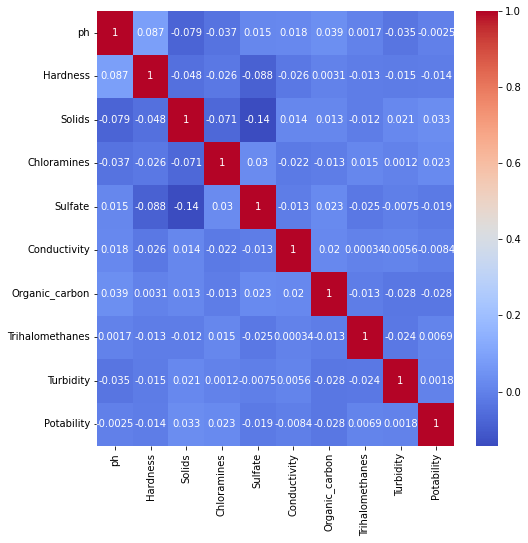

In [33]:
cor=df.corr()
plt.figure(figsize=(8,8))
sns.heatmap(cor,annot=True,cmap="coolwarm")
plt.show()

**Inference**
* Since there were outliers in the dataset as seen from the boxplot so we clipped the dataset at 99 percentile on the upper end 
  and 1 percentile at the lower end
* Our dataset has missing values in three columns so we replace them with the mean after doing the outlier treatment 
* As seen from the correlation plot there is not much correlation amongst the features in the dataset

In [34]:
x=df.drop(columns=["Potability"])
y=df["Potability"]

In [35]:
x.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
0,7.082947,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135
1,3.716080,129.422921,18630.057858,6.635246,333.858036,592.885359,15.180013,56.329076,4.500656
2,8.099124,224.236259,19909.541732,9.275884,333.858036,418.606213,16.868637,66.420093,3.055934
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075


### Model building

In [36]:
from sklearn.model_selection import train_test_split

In [37]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.25,random_state=42)
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(2457, 9)
(819, 9)
(2457,)
(819,)


In [38]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.metrics import roc_auc_score,roc_curve
from sklearn.metrics import accuracy_score,recall_score,precision_score,roc_auc_score,roc_curve
import warnings
warnings.filterwarnings('always')

In [43]:
def model_gen(model,x_train,y_train,x_test,y_test):
    model.fit(x_train,y_train)
    ypred = model.predict(x_test)
    acc=accuracy_score(y_test,ypred)
    prec=precision_score(y_test,ypred)
    rec=recall_score(y_test,ypred)
    cm = confusion_matrix(y_test,ypred)
    cls_rep=classification_report(y_test,ypred)
    print("Accuracy of the model: ",acc)
    print("Precision of the model: ",prec)
    print("Recall of the model: ",rec)
    print("Confusion matrix: ")
    print(cm)
    print("Classification report: ")
    print(cls_rep)

    return acc,prec,rec

In [44]:
def auc_roc(model):
    fpr,tpr,thresh = roc_curve(y_test,model.predict_proba(x_test)[:,1])
    print("AUC score: ", roc_auc_score(y_test,model.predict_proba(x_test)[:,1]))
    plt.plot(fpr,tpr,color='blue',marker='d',markersize=8)
    plt.plot([0,1],[0,1],label='TPR=FPR',linestyle=':',color='black')
    plt.title('ROC_AUC Curve')
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.legend
    plt.grid()
    plt.show()
    

In [45]:
m1=LogisticRegression()
acc_m1,prec_m1,rec_m1 = model_gen(m1,x_train,y_train,x_test,y_test)

Accuracy of the model:  0.6227106227106227
Precision of the model:  0.0
Recall of the model:  0.0
Confusion matrix: 
[[510   0]
 [309   0]]
Classification report: 
              precision    recall  f1-score   support

           0       0.62      1.00      0.77       510
           1       0.00      0.00      0.00       309

    accuracy                           0.62       819
   macro avg       0.31      0.50      0.38       819
weighted avg       0.39      0.62      0.48       819



C:\Users\user\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\user\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\user\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\user\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0

AUC score:  0.5398121708230218


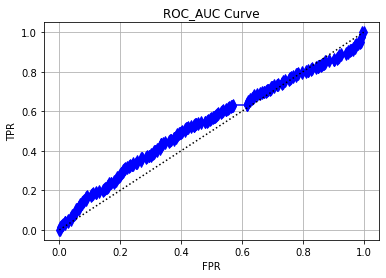

In [46]:
auc_roc(m1)

In [47]:
r1=pd.DataFrame({"model_name":"Logistic Regression","Accuracy":acc_m1,"Precision":prec_m1,"Recall":rec_m1},index=[0])
r1


,model_name,Accuracy,Precision,Recall
0,Logistic Regression,0.622711,0.0,0.0


In [48]:
from sklearn.tree import DecisionTreeClassifier

In [49]:
m2=DecisionTreeClassifier(criterion="gini",max_depth=4,min_samples_split=15)
acc_m2,prec_m2,rec_m2 = model_gen(m2,x_train,y_train,x_test,y_test)

Accuracy of the model:  0.6385836385836385
Precision of the model:  0.6382978723404256
Recall of the model:  0.0970873786407767
Confusion matrix: 
[[493  17]
 [279  30]]
Classification report: 
              precision    recall  f1-score   support

           0       0.64      0.97      0.77       510
           1       0.64      0.10      0.17       309

    accuracy                           0.64       819
   macro avg       0.64      0.53      0.47       819
weighted avg       0.64      0.64      0.54       819



AUC score:  0.597214290246843


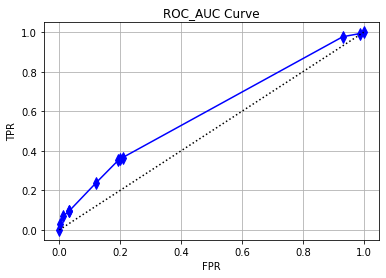

In [94]:
auc_roc(m2)

In [50]:
r2=pd.DataFrame({"model_name":"Decision Tree","Accuracy":acc_m2,"Precision":prec_m2,"Recall":rec_m2},index=[1])
r2

,model_name,Accuracy,Precision,Recall
1,Decision Tree,0.638584,0.638298,0.097087


In [51]:
params={"criterion": ["gini", "entropy"],
       "max_depth" :[5, 7,9,11],
       "min_samples_split":[20, 50,100, 200],
       "min_samples_leaf": [5,10,15,30]}

In [52]:
from sklearn.model_selection import GridSearchCV

In [53]:
dtg=DecisionTreeClassifier(random_state=0)

dt_grid=GridSearchCV(estimator=dtg, param_grid=params, cv=10, n_jobs=-1,
                     verbose=2)
dt_grid.fit(x_train,y_train)

Fitting 10 folds for each of 128 candidates, totalling 1280 fits


GridSearchCV(cv=10, estimator=DecisionTreeClassifier(random_state=0), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [5, 7, 9, 11],
                         'min_samples_leaf': [5, 10, 15, 30],
                         'min_samples_split': [20, 50, 100, 200]},
             verbose=2)

In [54]:
dt_grid.best_params_

{'criterion': 'entropy',
 'max_depth': 11,
 'min_samples_leaf': 5,
 'min_samples_split': 100}

In [55]:
m3=DecisionTreeClassifier(criterion="entropy",max_depth=11,min_samples_split=100,min_samples_leaf=5)
acc_m3,prec_m3,rec_m3 = model_gen(m3,x_train,y_train,x_test,y_test)

Accuracy of the model:  0.6312576312576312
Precision of the model:  0.5212121212121212
Recall of the model:  0.2783171521035599
Confusion matrix: 
[[431  79]
 [223  86]]
Classification report: 
              precision    recall  f1-score   support

           0       0.66      0.85      0.74       510
           1       0.52      0.28      0.36       309

    accuracy                           0.63       819
   macro avg       0.59      0.56      0.55       819
weighted avg       0.61      0.63      0.60       819



AUC score:  0.5894060536836093


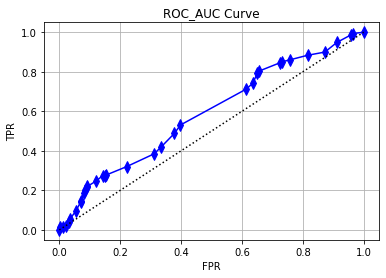

In [95]:
auc_roc(m3)

In [56]:
r3=pd.DataFrame({"model_name":"Decision Tree with tuning","Accuracy":acc_m3,"Precision":prec_m3,"Recall":rec_m3},index=[2])
r3

,model_name,Accuracy,Precision,Recall
2,Decision Tree with tuning,0.631258,0.521212,0.278317


In [57]:
from sklearn.ensemble import RandomForestClassifier

In [58]:
m4=RandomForestClassifier()
acc_m4,prec_m4,rec_m4 = model_gen(m4,x_train,y_train,x_test,y_test)

Accuracy of the model:  0.6727716727716728
Precision of the model:  0.632258064516129
Recall of the model:  0.31715210355987056
Confusion matrix: 
[[453  57]
 [211  98]]
Classification report: 
              precision    recall  f1-score   support

           0       0.68      0.89      0.77       510
           1       0.63      0.32      0.42       309

    accuracy                           0.67       819
   macro avg       0.66      0.60      0.60       819
weighted avg       0.66      0.67      0.64       819



AUC score:  0.6792880258899677


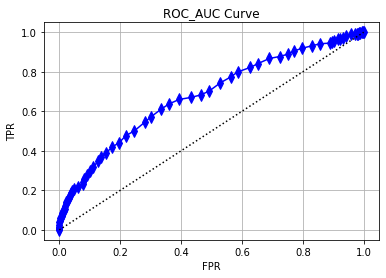

In [96]:
auc_roc(m4)

In [59]:
r4=pd.DataFrame({"model_name":"Random Forest","Accuracy":acc_m4,"Precision":prec_m4,"Recall":rec_m4},index=[3])
r4

,model_name,Accuracy,Precision,Recall
3,Random Forest,0.672772,0.632258,0.317152


In [60]:
params={
    "n_estimators": [100, 150, 200, 300],
    "max_depth": [5, 7, 9,11, 13],
    "min_samples_split":[20,50, 100],
    "min_samples_leaf" : [10, 20, 30],
    "bootstrap" :[True],
    "criterion" : ["gini", "entropy"]
}

rf1=RandomForestClassifier(random_state=0)
Grf=GridSearchCV(rf1, param_grid=params, cv=10, n_jobs=-1, verbose=1)
Grf.fit(x_train,y_train)

Fitting 10 folds for each of 360 candidates, totalling 3600 fits


GridSearchCV(cv=10, estimator=RandomForestClassifier(random_state=0), n_jobs=-1,
             param_grid={'bootstrap': [True], 'criterion': ['gini', 'entropy'],
                         'max_depth': [5, 7, 9, 11, 13],
                         'min_samples_leaf': [10, 20, 30],
                         'min_samples_split': [20, 50, 100],
                         'n_estimators': [100, 150, 200, 300]},
             verbose=1)

In [61]:
Grf.best_params_

{'bootstrap': True,
 'criterion': 'entropy',
 'max_depth': 13,
 'min_samples_leaf': 10,
 'min_samples_split': 20,
 'n_estimators': 200}

In [62]:
m5=RandomForestClassifier(n_estimators=200,max_depth=13,min_samples_split=20,min_samples_leaf=10,criterion="entropy",bootstrap=True)
acc_m5,prec_m5,rec_m5 = model_gen(m5,x_train,y_train,x_test,y_test)

Accuracy of the model:  0.6752136752136753
Precision of the model:  0.6972477064220184
Recall of the model:  0.2459546925566343
Confusion matrix: 
[[477  33]
 [233  76]]
Classification report: 
              precision    recall  f1-score   support

           0       0.67      0.94      0.78       510
           1       0.70      0.25      0.36       309

    accuracy                           0.68       819
   macro avg       0.68      0.59      0.57       819
weighted avg       0.68      0.68      0.62       819



AUC score:  0.6890094549146519


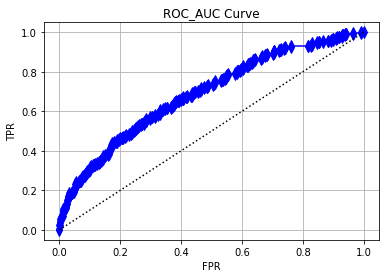

In [97]:
auc_roc(m5)

In [63]:
r5=pd.DataFrame({"model_name":"Random Forest with tuning","Accuracy":acc_m5,"Precision":prec_m5,"Recall":rec_m5},index=[4])
r5

,model_name,Accuracy,Precision,Recall
4,Random Forest with tuning,0.675214,0.697248,0.245955


In [64]:
from sklearn.ensemble import AdaBoostClassifier

In [65]:
dt1 = DecisionTreeClassifier(max_depth=4,min_samples_split=20,criterion='entropy')  # decision stump
m6 = AdaBoostClassifier(base_estimator=dt1,n_estimators=60)
acc_m6,prec_m6,rec_m6 = model_gen(m6,x_train,y_train,x_test,y_test)

Accuracy of the model:  0.6178266178266179
Precision of the model:  0.4930555555555556
Recall of the model:  0.459546925566343
Confusion matrix: 
[[364 146]
 [167 142]]
Classification report: 
              precision    recall  f1-score   support

           0       0.69      0.71      0.70       510
           1       0.49      0.46      0.48       309

    accuracy                           0.62       819
   macro avg       0.59      0.59      0.59       819
weighted avg       0.61      0.62      0.61       819



AUC score:  0.6067897709245511


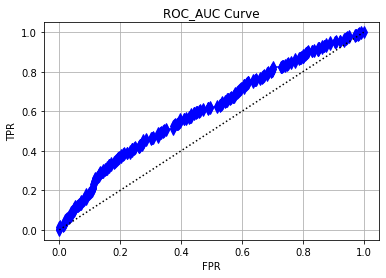

In [98]:
auc_roc(m6)

In [66]:
r6=pd.DataFrame({"model_name":"Adaboost","Accuracy":acc_m6,"Precision":prec_m6,"Recall":rec_m6},index=[5])
r6

,model_name,Accuracy,Precision,Recall
5,Adaboost,0.617827,0.493056,0.459547


In [88]:
rf=RandomForestClassifier()
m7 = AdaBoostClassifier(base_estimator=rf,n_estimators=60)
acc_m7,prec_m7,rec_m7 = model_gen(m7,x_train,y_train,x_test,y_test)

Accuracy of the model:  0.6752136752136753
Precision of the model:  0.6257309941520468
Recall of the model:  0.34627831715210355
Confusion matrix: 
[[446  64]
 [202 107]]
Classification report: 
              precision    recall  f1-score   support

           0       0.69      0.87      0.77       510
           1       0.63      0.35      0.45       309

    accuracy                           0.68       819
   macro avg       0.66      0.61      0.61       819
weighted avg       0.66      0.68      0.65       819



AUC score:  0.6806142521733612


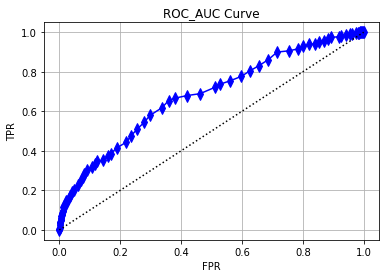

In [99]:
auc_roc(m7)

In [89]:
r7=pd.DataFrame({"model_name":"Adaboost with RF","Accuracy":acc_m7,"Precision":prec_m7,"Recall":rec_m7},index=[6])
r7

,model_name,Accuracy,Precision,Recall
6,Adaboost with RF,0.675214,0.625731,0.346278


In [90]:
from sklearn.neighbors import KNeighborsClassifier

In [91]:
m8=KNeighborsClassifier(n_neighbors=11)
acc_m8,prec_m8,rec_m8 = model_gen(m8,x_train,y_train,x_test,y_test)

Accuracy of the model:  0.5763125763125763
Precision of the model:  0.4020618556701031
Recall of the model:  0.2524271844660194
Confusion matrix: 
[[394 116]
 [231  78]]
Classification report: 
              precision    recall  f1-score   support

           0       0.63      0.77      0.69       510
           1       0.40      0.25      0.31       309

    accuracy                           0.58       819
   macro avg       0.52      0.51      0.50       819
weighted avg       0.54      0.58      0.55       819



AUC score:  0.5179135731962689


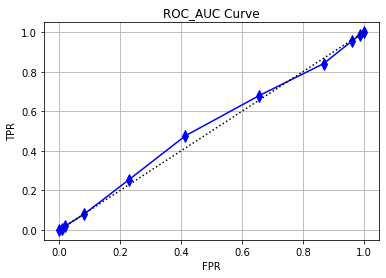

In [100]:
auc_roc(m8)

In [92]:
r8=pd.DataFrame({"model_name":"KNN","Accuracy":acc_m7,"Precision":prec_m7,"Recall":rec_m7},index=[6])
r8

,model_name,Accuracy,Precision,Recall
6,KNN,0.675214,0.625731,0.346278


In [80]:
neighbors=list(range(3,51,2))
knn_acc=[]
for i in neighbors:
    m=KNeighborsClassifier(n_neighbors=i)
    m.fit(x_train,y_train)
    ypred=m.predict(x_test)
    knn_acc.append(accuracy_score(y_test,ypred))

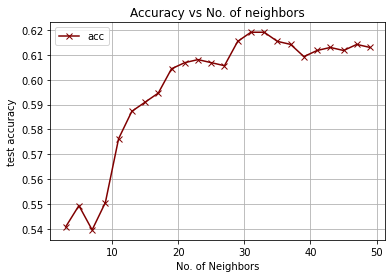

In [81]:
plt.plot(neighbors,knn_acc,color='maroon',label='acc',marker="x")
plt.xlabel('No. of Neighbors')
plt.ylabel('test accuracy')
plt.title('Accuracy vs No. of neighbors')
plt.legend()
plt.grid()
plt.show()

In [82]:
m9=KNeighborsClassifier(n_neighbors=35)
acc_m9,prec_m9,rec_m9 = model_gen(m9,x_train,y_train,x_test,y_test)

Accuracy of the model:  0.6153846153846154
Precision of the model:  0.45714285714285713
Recall of the model:  0.10355987055016182
Confusion matrix: 
[[472  38]
 [277  32]]
Classification report: 
              precision    recall  f1-score   support

           0       0.63      0.93      0.75       510
           1       0.46      0.10      0.17       309

    accuracy                           0.62       819
   macro avg       0.54      0.51      0.46       819
weighted avg       0.56      0.62      0.53       819



AUC score:  0.5137127990354718


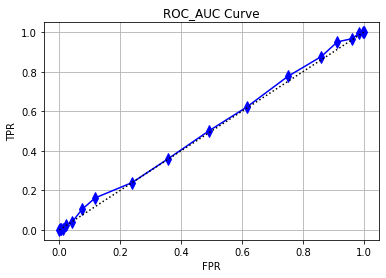

In [101]:
auc_roc(m9)

In [83]:
r9=pd.DataFrame({"model_name":"KNN with tuning","Accuracy":acc_m9,"Precision":prec_m9,"Recall":rec_m9},index=[8])
r9

,model_name,Accuracy,Precision,Recall
8,KNN with tuning,0.615385,0.457143,0.10356


In [84]:
from sklearn.svm import SVC

In [85]:
m10=SVC(kernel='linear',C=1)
acc_m10,prec_m10,rec_m10 = model_gen(m10,x_train,y_train,x_test,y_test)

Accuracy of the model:  0.6178266178266179
Precision of the model:  0.3
Recall of the model:  0.009708737864077669
Confusion matrix: 
[[503   7]
 [306   3]]
Classification report: 
              precision    recall  f1-score   support

           0       0.62      0.99      0.76       510
           1       0.30      0.01      0.02       309

    accuracy                           0.62       819
   macro avg       0.46      0.50      0.39       819
weighted avg       0.50      0.62      0.48       819



In [86]:
r10=pd.DataFrame({"model_name":"SVM","Accuracy":acc_m10,"Precision":prec_m10,"Recall":rec_m10},index=[9])
r10

,model_name,Accuracy,Precision,Recall
9,SVM,0.617827,0.3,0.009709


In [93]:
re=[r1,r2,r3,r4,r5,r6,r7,r8,r9,r10]
res=pd.concat(re)
res

,model_name,Accuracy,Precision,Recall
0,Logistic Regression,0.622711,0.000000,0.000000
1,Decision Tree,0.638584,0.638298,0.097087
2,Decision Tree with tuning,0.631258,0.521212,0.278317
3,Random Forest,0.672772,0.632258,0.317152
4,Random Forest with tuning,0.675214,0.697248,0.245955
5,Adaboost,0.617827,0.493056,0.459547
6,Adaboost with RF,0.675214,0.625731,0.346278
6,KNN,0.675214,0.625731,0.346278
8,KNN with tuning,0.615385,0.457143,0.103560
9,SVM,0.617827,0.300000,0.009709
